<a href="https://colab.research.google.com/github/AbhiMehra02/Dog-Breed-Classification/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

 # 🐶 End-to-End Multi-class Dog Breed CLassification

 This notebook builds an end-to-end multiclass image classifier using TenserFlow 2.0 and Tenserflow hub.

 ## 1. Problem

 Identifying the breed  of a dog  an image of a dog.

 when i am see a dog, I wanted to know what breed of dog it is.

 ## 2. Data

The  data is using from Kaggle's  dog breed identification competition.

https://www.kaggle.com/competitions/dog-breed-identification/data

 ## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

 ## 4. Features

 Some information about the data:
 * We're dealing with images(unstructured data) so it's probabily best we use deep learning/transfer learning.
 * There are 120 breeds of dogs (this means there are 120 different classes).
 * There are around 10,000+ images in the training set(this images have labels).
 * There are around 10,000+ images in the test
 set(this images haven't labels, beacuse we'll have to predict them).

# to unzip the file in google drive
!unzip "drive/MyDrive/dog vision/dog-breed-identification.zip" -d "drive/MyDrive/dog vision/"

### Get our Workspaces ready

In [ ]:
# Import necessary tool
import tensorflow as tf
import tensorflow_hub as hub
print("TF version :",tf.__version__)
print("TF Hub version :",hub.__version__)

# check for GPU availability
print("GPU","available (YES!!!!!)" if tf.config.list_physical_devices("GPU")else "not available :(")

TF version : 2.12.0
TF Hub version : 0.13.0
GPU available (YES!!!!!)


##  Getting our data ready(turning into tensor)

With all machine learnings models, our data has to be in numerical format. So that's what we'll be doing first. Turning our images into Tensors (numerical representation)

let's start by accessing our data and checking out the labels.

In [ ]:
# Checkout  the labels of our data
import pandas as pd
labels_csv=pd.read_csv("drive/MyDrive/dog vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: >

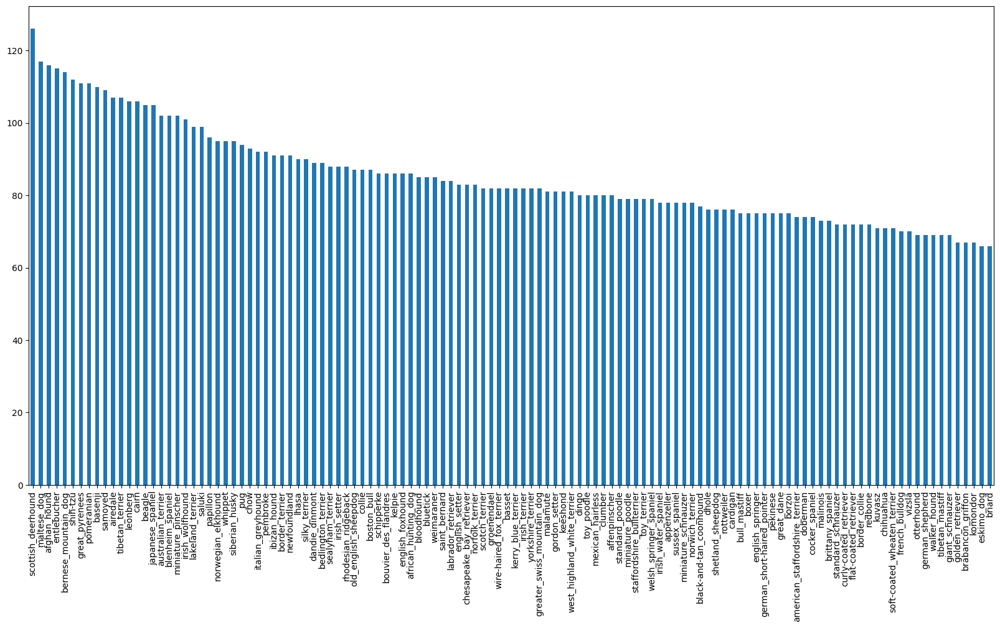

In [ ]:
# How many images are there of each breed ?
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

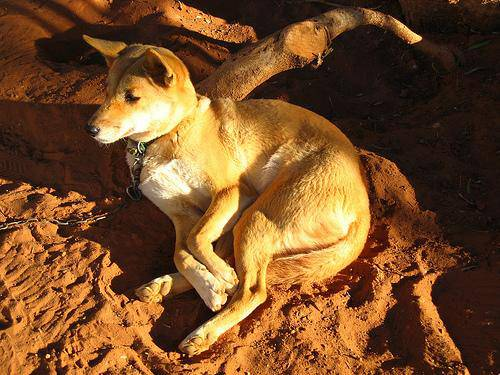

In [ ]:
# Let's  view  an image
from IPython.display import Image
Image("drive/MyDrive/dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels

let's get a list of all our image file pathnames.

In [ ]:
# Create pathnames from image ID's
filenames =["drive/MyDrive/dog vision/train/"+fname+".jpg" for fname in labels_csv["id"]]

#check the first 10
filenames

['drive/MyDrive/dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/dog vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/dog vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/dog vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/dog vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/dog vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/dog vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/dog vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/dog vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg',
 'drive/MyDrive/dog vision/train/004396df1acd0f1247b740ca2b14616e.jpg',
 'drive/MyDrive/dog vision/train/0067dc3eab0b3c3ef0439477624d85d6.jpg',
 'drive/MyDrive/dog vision/train/00693b8bc2470375cc744a6391d397ec.jpg',
 'drive/MyDrive/dog vision/train/006cc3ddb9dc1bd827479569fcdc52d

In [ ]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("drive/MyDrive/dog vision/train/")) == len(filenames):
  print("Filenames match actual amount of files!! proceed.")
else:
  print("Filenames don't match actual amount of files, check the target directory.")

Filenames match actual amount of files!! proceed.


In [ ]:
len(filenames)

10222

In [ ]:
import os
len(os.listdir("drive/MyDrive/dog vision/train/"))

10222

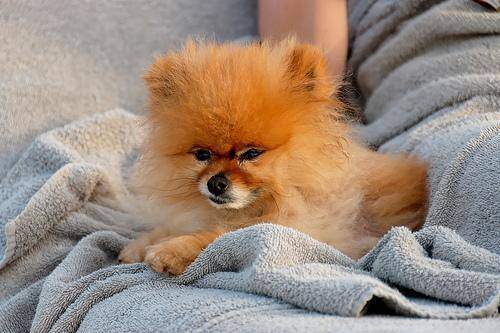

In [ ]:
# One more check
Image(filenames[8000])

In [ ]:
labels_csv["breed"][8000]

'pomeranian'

Since we've now got our training images filepaths in a list, let's prepare our labels.



In [ ]:
import numpy as np
labels=labels_csv["breed"].to_numpy()
# labels = np.array(labels) #does same thing as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# See if number of labels matches the number of filenames
if len(labels)==len(filenames):
  print("Number of labels matches number of files names!!")
else:
  print("Number of labels doesn't matches number of files names,check data directories")

Number of labels matches number of files names!!


In [ ]:
# Find the unique labels values
unique_breeds=np.unique(labels)
len(unique_breeds)

120

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0]==unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every labels into boolean array
boolean_labels =[label==unique_breeds for label in labels]
boolean_labels[:2]


[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example: turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds==labels[0])) #index where labels occurs
print(boolean_labels[0].argmax()) #index where label occurs in boolean array
print(boolean_labels[0].astype(int)) #there will be a 1 where the sample occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
filenames[:10]

['drive/MyDrive/dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/dog vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/dog vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/dog vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/dog vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/dog vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/dog vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/dog vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/dog vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
filenames[:10]

['drive/MyDrive/dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/dog vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/dog vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/dog vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/dog vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/dog vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/dog vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/dog vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/dog vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

### Creating our own validation set

Since the dataset from Kaggle doesn't come with a validation set, we're going to create our own.

In [ ]:
# Setup X & y variables
X =filenames
y= boolean_labels

In [ ]:
len(filenames)

10222

We're going to start off experimenting with ~1000 images and increase as needed.

In [ ]:
# Setup  number of images to use for experimentally
NUM_IMAGES =1000  #@param {type:"slider", min:1000 , max:10000, step:1000}

In [ ]:
# Let's split our dta into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total  size NUM_IMAGES
X_train,X_val,y_train,y_val=train_test_split(X[:NUM_IMAGES],
                                             y[:NUM_IMAGES],
                                             test_size=0.2,
                                             random_state=42)
len(X_train),len(y_train),len(X_val),len(y_val)

(800, 800, 200, 200)

In [ ]:
# Let's have a geez at the training data
X_train[:5],y_train[:2]

(['drive/MyDrive/dog vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/dog vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/dog vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/dog vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/dog vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

## Preprocessing Images (turning into Tensors)

To preprocess our images into Tensors we're going to write a function which
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into tensors
4. Normalize our image (convert color channel values from 0-244 to 0-1).
5. Resize the `image` to be a shape (224,224)
6. Return the modified `image`

Before we do, let's see what importing an image looks like.

In [ ]:
# Convert image to NumPy array
from matplotlib.pyplot import imread
image=imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image.max(),image.min() # RGB range from 0-255

(255, 0)

In [ ]:
# turn numpy array to tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

Now we've seen what an image image looks like as a Tensor, let's make a function preprocess them.

https://www.tensorflow.org/tutorials/load_data/images

In [ ]:
# Define image size
IMG_SIZE =224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Take an image file path and turn the image into Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Read,Green,Blue)
  image =tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values
  image =tf.image.convert_image_dtype(image,tf.float32)
  # Resize the image to out desired value(224,224)
  image =tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image


In [ ]:
# tensor  =tf.io.read_file(filenames[26])
# tensor

In [ ]:
# tensor=tf.image.decode_jpeg(tensor, channels=3)
# tensor

In [ ]:
# tensor=tf.image.convert_image_dtype(tensor,tf.float32)
# tensor

## Turning our data into batches

Why turn our data into batches?

let's say you're trying to preprocess 10,000+ images in one go.... they all might not fit into memory.

So that's why we do about 32(this is the batch size) images at a time (you can manually adjust the batch size if need be).

In order to use TensorFLow effectively, we need  our data in the form of Tensor tuples which look like this: `(images,labels) `

In [ ]:
# Create a simple function to return a tuple  (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  preprocesses the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return image , label

In [ ]:
# Demo of the above
# (process_image(filenames[42]) , boolean_labels)
(process_image(X[42]),tf.constant(y[42]))


(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [ ]:
get_image_label(X[0],y[0])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.5705322 , 0.33588538, 0.15008473],
         [0.66901225, 0.4601166 , 0.26022965],
         [0.61062384, 0.43763596, 0.21601713],
         ...,
         [0.8182312 , 0.7297958 , 0.26963907],
         [0.72454786, 0.6059109 , 0.2653059 ],
         [0.7494603 , 0.6252918 , 0.32456532]],
 
        [[0.6761415 , 0.4733761 , 0.30642927],
         [0.5672121 , 0.38192675, 0.20349538],
         [0.5883547 , 0.4322571 , 0.2403155 ],
         ...,
         [0.9326942 , 0.8260503 , 0.41093278],
         [0.86072475, 0.74250627, 0.3694122 ],
         [0.76781666, 0.6461604 , 0.29291284]],
 
        [[0.46350825, 0.29595745, 0.1536156 ],
         [0.42554107, 0.27039403, 0.12009468],
         [0.7887875 , 0.6547362 , 0.49015   ],
         ...,
         [0.89372385, 0.7696401 , 0.41811958],
         [0.88609535, 0.7585918 , 0.36495727],
         [0.8243601 , 0.69494826, 0.2930575 ]],
 
        ...,
 
        [[0.7344025 , 0.4716574 

Now we've got a way to turn  our data into tuples of Tensors in the form:`(image,label)`, let's make a fun funtion to turn all of our data (x & y) into batches

In [ ]:
# Define the batch size , 32 is a good start
BATCH_SIZE =32

# Create a function to turn into batches
def create_data_batches(X,y=None,batch_size=BATCH_SIZE,valid_data=False,test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  shuffles the data if it's training data  but doesn't shuffle if it's a validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is  a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches....")
    data =tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch =data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                              tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                                tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor funtion is faster than  shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (images, label) tuples (this also tuerns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch =data.batch(BATCH_SIZE)

  return data_batch


In [ ]:
 # Creating training and validation data  batches
train_data = create_data_batches(X_train,y_train)
val_data = create_data_batches(X_val,y_val,valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
#  Check out the different attributes of our data batches
train_data.element_spec,val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

our data is now in batches,however, these can be a little hard to understand/compreheand, let's visualize them!

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewoing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10,10))

  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows , 5 columns)
    ax=plt.subplot(5,5,i+1)

    # Display an image
    plt.imshow(images[i])

    #Add the images as label as title
    plt.title(unique_breeds[labels[i].argmax()])

    # turn the grid lines off
    plt.axis("off")



In [ ]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
#taken train data and unbatched using numpy iterator or turn into iterator
# train_images, train_labels =next(train_data.as_numpy_iterator())
# len(train_images),len(train_labels)

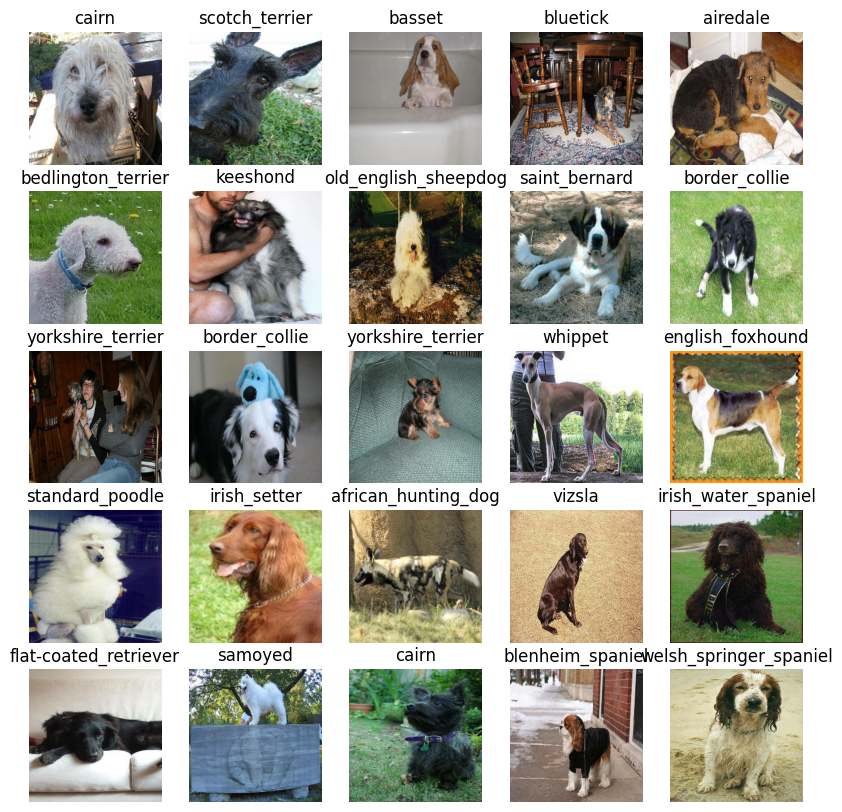

In [ ]:
# Now let's visualize our validation set set
val_images, val_labels=next(val_data.as_numpy_iterator())
show_25_images(val_images,val_labels)

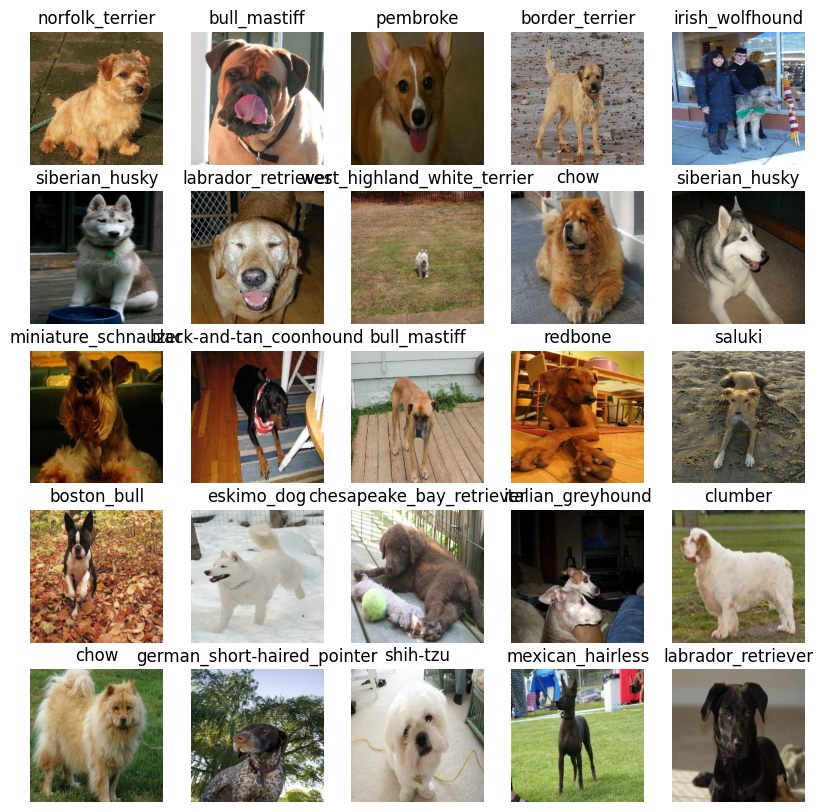

In [ ]:
# Now let's visualize the data in a training batch
train_images, train_labels =next(train_data.as_numpy_iterator())
show_25_images(train_images,train_labels)

## Building model

Before we build a model, there are a few things we neeed to define:
* The input shape (our images, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use from tensor flow hub.
https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5

In [ ]:
IMG_SIZE

224

In [ ]:
# Setup input shape to the model
INPUT_SHAPE =[None, IMG_SIZE , IMG_SIZE ,3] # batch, height , width , colout channels

# Setup output shape of our mode
OUTPUT_SHAPE =len(unique_breeds)

# Setup model URL from Tensorflow Hub
MODEL_URL="https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"


Now we've got our inputs, outputs and model ready to go, Let's put them together into Keras deep Learning model!

Knowing this, let's Create a function Which:
* Takes the shape, output shape and model we've chosen as parameters.
* Defines the layers in a Keras model in Sequential Fashion (do this first, then this , then that).
* Compile the model (says it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model.

All of the steps can be found here: https://www.tensorflow.org/guide/keras

In [ ]:
# Create a function which buids a keras model
def create_model(input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE,model_url=MODEL_URL):
  print("Building model with :",MODEL_URL)

  # Setup the model layers
  model=tf.keras.Sequential([
     hub.KerasLayer(MODEL_URL), # Layer 1(input layer)
     tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                           activation="softmax") # Layer 2
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # BUild the model
  model.build(INPUT_SHAPE)

  return model



In [ ]:
model=create_model()
model.summary()

Building model with : https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


In [ ]:
outputs =np.ones(shape=[1,1,1280])
outputs

array([[[1., 1., 1., ..., 1., 1., 1.]]])

## Creating Callback
Callbacks are helper functions a model can use during training to do such things as save its progress or stop training early if a model stop progressing.

We'll create two callbacks, one for tensorboard which helps track our models progress and another for early stopping which prevents our model from training for too long.

### TensorBoard Callback

To setup a Tensorboard callback, we need to do 3 things:
1. Load the TensorBoard notebook extension.
2. Create TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize our models training logs with the `%tensorboard` magic function (we'll do this after model training).



In [ ]:
# load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard Callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard
  logdir= os.path.join("drive/MyDrive/dog vision/logs",
                       # Make  it so the logs get trackes whether we erun an experiment
                       datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)



### Early stopping  Callback

early stopping helps stop our model from overfitting trianing if a certain evaluation metric stop improving

In [ ]:
# Create early stopping callback
early_stopping =tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                 patience=3)

## Training a model (on subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working .

In [ ]:
NUM_EPOCHS=100 # @param {type:"slider",min:10,max:100,step:10}

In [ ]:
# Check to make sure we're still running on a GPU
print("GPU","available (YESSSS!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available (YESSSS!!!!)


Let's Create a functio Which trains a model.

* Create a model using `create_tensorboard_callback()`.
* Setup a TensorBoard callback using `create_tensorboard_callback()`.
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for (`NUM_EPOCHS`) and the callbacks we'd like to use.
* Return the model

In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard= create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard,early_stopping])

  #return the model
  return model

In [ ]:
# Fit the modet to the data
model =train_model()

Building model with : https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 15s 232ms/step - loss: 4.5661 - accuracy: 0.1000 - val_loss: 3.3863 - val_accuracy: 0.2400
Epoch 2/100
25/25 [==============================] - 5s 196ms/step - loss: 1.6238 - accuracy: 0.6737 - val_loss: 2.1472 - val_accuracy: 0.4850
Epoch 3/100
25/25 [==============================] - 3s 118ms/step - loss: 0.5718 - accuracy: 0.9300 - val_loss: 1.6553 - val_accuracy: 0.5900
Epoch 4/100
25/25 [==============================] - 3s 119ms/step - loss: 0.2538 - accuracy: 0.9887 - val_loss: 1.5206 - val_accuracy: 0.6300
Epoch 5/100
25/25 [==============================] - 4s 175ms/step - loss: 0.1466 - accuracy: 0.9987 - val_loss: 1.4415 - val_accuracy: 0.6350
Epoch 6/100
25/25 [==============================] - 4s 176ms/step - loss: 0.0989 - accuracy: 1.0000 - val_loss: 1.3779 - val_accuracy: 0.6550
Epoch 7/100
25/25 [============================

**Question** It looks like our model is overfitting beacuse it's performing far better on the training dataset than the validation some ways to prevent model overfitting in deep learning neural networks?

**Note**: Overfitting to begin with is a good thing! it means our model is learning!!!!

### Checking the TensorBoard logs

The TensorBOard magic function (`%tensorboard`) will acess the logs directory we created earlier and visualize its contents.

In [ ]:
%tensorboard --logdir drive/MyDrive/dog\ vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Make predictionon the validation data(not uded to train on)
predictions=model.predict(val_data,verbose=1)
predictions

7/7 [==============================] - 11s 91ms/step


array([[3.3024817e-03, 1.1069114e-04, 7.6645840e-04, ..., 9.2563429e-04,
        3.7611804e-05, 2.2446832e-02],
       [7.6818410e-03, 1.4894031e-03, 1.8050522e-02, ..., 6.9660210e-04,
        4.0562344e-03, 3.3888360e-04],
       [2.1025274e-04, 1.4342832e-04, 7.3338357e-05, ..., 7.0228055e-04,
        1.4005342e-04, 8.6714781e-04],
       ...,
       [1.1436557e-05, 2.0946427e-05, 5.1475008e-06, ..., 1.1078477e-05,
        3.0190769e-05, 1.6228696e-05],
       [1.0714355e-03, 6.3006592e-05, 2.1596416e-05, ..., 7.6721844e-05,
        1.2019871e-05, 1.8338851e-03],
       [3.0612948e-04, 9.0336107e-06, 2.0624937e-03, ..., 5.6537772e-03,
        8.1742276e-04, 2.2419297e-05]], dtype=float32)

In [ ]:
np.sum(predictions[0])

1.0

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(y_val)

200

In [ ]:
len(unique_breeds)

120

##### @param {type:"slider",min:0,max:100,step:1}

In [ ]:
#First prediction
index =0
print(predictions[index])
print(f"Max value (probability of prediction) :{ np.max(predictions[index])}")
print(f"Sum :{np.sum(predictions[index])}")
print(f"Max index :{np.argmax(predictions[index])}")
print(f"Predicted label :{unique_breeds[np.argmax(predictions[index])]}")

[3.3024817e-03 1.1069114e-04 7.6645840e-04 1.0939654e-04 1.2829636e-04
 5.8686455e-05 6.7906596e-02 3.7236829e-04 9.1780450e-05 2.4884852e-04
 4.8108687e-04 1.1645412e-04 1.0217477e-03 1.3788157e-04 2.1013099e-04
 4.6117441e-04 5.7311653e-04 1.3636678e-01 8.5001062e-05 7.3550828e-04
 1.6217602e-03 7.1172377e-05 4.3011420e-05 1.1037601e-03 6.9277798e-05
 1.0920734e-04 1.1724594e-01 2.9264978e-04 8.9563639e-04 3.6971775e-04
 1.4001508e-04 1.3092615e-03 3.2471569e-04 3.3512217e-05 3.2850243e-05
 8.3185971e-02 6.0965795e-05 8.2964107e-05 1.3111270e-04 3.7193811e-04
 2.9274193e-03 1.0388899e-04 5.4428496e-05 7.7610421e-05 7.7500779e-05
 2.6833243e-04 5.8085050e-05 4.3045828e-04 1.4145061e-04 1.5482089e-03
 1.4127058e-04 1.3804667e-04 2.4575402e-04 3.7405978e-05 3.0906734e-04
 1.6099132e-04 2.9066257e-05 6.4238947e-04 1.9703024e-04 1.8655597e-01
 1.5230363e-04 1.6606307e-05 2.8774966e-04 2.6465987e-05 2.5023855e-04
 1.8269980e-02 3.2409848e-04 2.1519476e-04 3.0032804e-02 7.7492572e-05
 1.693

In [ ]:
unique_breeds[np.argmax(val_labels[0])]

'cairn'

Having the above functionality is great but we want to be able to do it at sacle.

And it would be even better if we could see the image the prediction is being made on!

**NOTE**:Prediction probabilities are also known as confindence levels.

In [ ]:
# Turn prediction probabilities into their respective label(easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label=get_pred_label(predictions[81])
pred_label

'dingo'

Now sice our validati on data is still in a batch dataset, we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns seprate arrays
  of image and labels.
  """
  images=[]
  labels=[]

  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0],val_labels[0]


(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(val_labels[0])

'affenpinscher'

In [ ]:
get_pred_label(predictions[0])

'irish_wolfhound'

Now we've got ways to get:
* Prediction label
* Validation label (truth labels)
* Validation images

Let's make some function to make these all a bit more visualize.

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer.
* Convert the prediction  probabilities,
to a predicted label.
* Plot the predicted label, its predicted probability, the truth label and the target image on a sinle plot.

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  view the prediction, ground truth and image for sample n
  """
  pred_prob, true_label,image =prediction_probabilities[n],labels[n],images[n]

  # Get the pred label
  pred_label =get_pred_label(pred_prob)

  #plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colorof title dependind on if the prediction is right or  wrong
  if pred_label==true_label:
    color="green"
  else:
    color="red"

  # Change plot title to be predicted, probabilities of prediction and truth label
  plt.title("{}{:2.0f}% {}".format(pred_label,
                            np.max(pred_prob)*100,
                            true_label),
                            color=color)


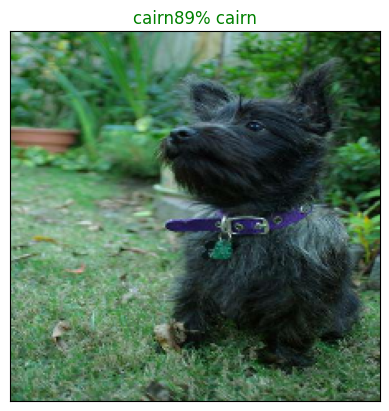

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=22)

Now we've get one function  to visualize our models top prediction, let's make another to view our models top 10 prediction.

This function will:
* Take an input of predictions probabilities array and a ground truth array and an integer
* Find the prediction using `get_pred_label()`
* Find the top:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels

* Plot the top 10n prediction probability values and labels, coloring the true label green

In [ ]:
def plot_pred_conf(prediction_probabilities,labels,n=1):
  """
  Plus the top 10 highest prediction confidence along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label =get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  #Find the top 10 prediction confidence values
  top_10_pred_values  = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels  = unique_breeds[top_10_pred_indexes]

  # setup plot
  top_plot =plt.bar(np.arange(len(top_10_pred_labels)),
                    top_10_pred_values,
                    color="grey")

  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels==true_label)].set_color("green")
  else:
    pass

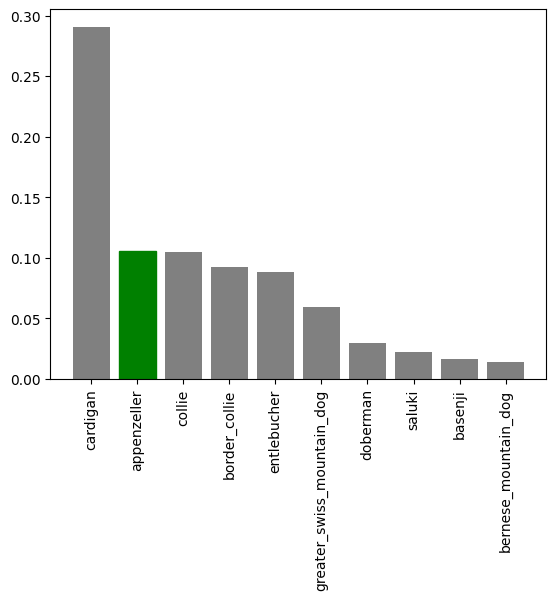

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=199)

In [ ]:
predictions[0]

array([3.3024817e-03, 1.1069114e-04, 7.6645840e-04, 1.0939654e-04,
       1.2829636e-04, 5.8686455e-05, 6.7906596e-02, 3.7236829e-04,
       9.1780450e-05, 2.4884852e-04, 4.8108687e-04, 1.1645412e-04,
       1.0217477e-03, 1.3788157e-04, 2.1013099e-04, 4.6117441e-04,
       5.7311653e-04, 1.3636678e-01, 8.5001062e-05, 7.3550828e-04,
       1.6217602e-03, 7.1172377e-05, 4.3011420e-05, 1.1037601e-03,
       6.9277798e-05, 1.0920734e-04, 1.1724594e-01, 2.9264978e-04,
       8.9563639e-04, 3.6971775e-04, 1.4001508e-04, 1.3092615e-03,
       3.2471569e-04, 3.3512217e-05, 3.2850243e-05, 8.3185971e-02,
       6.0965795e-05, 8.2964107e-05, 1.3111270e-04, 3.7193811e-04,
       2.9274193e-03, 1.0388899e-04, 5.4428496e-05, 7.7610421e-05,
       7.7500779e-05, 2.6833243e-04, 5.8085050e-05, 4.3045828e-04,
       1.4145061e-04, 1.5482089e-03, 1.4127058e-04, 1.3804667e-04,
       2.4575402e-04, 3.7405978e-05, 3.0906734e-04, 1.6099132e-04,
       2.9066257e-05, 6.4238947e-04, 1.9703024e-04, 1.8655597e

In [ ]:
predictions[0].argsort()

array([ 61,  63,  56,  34,  33,  53, 118,  22, 112,  42,  46,   5,  36,
        92,  24,  75,  21,  69,  44,  43,  37,  18,   8, 115,  41,  94,
        25,   3,   1,  11,   4, 101,  38,  13,  51,  30,  50,  48,  60,
        55,  88, 108,  99,  58,  86,  14,  67, 114,  52, 107,   9,  64,
        91,  45,  84,  62,  27,  87,  54,  66,  32,  89, 111, 113,  29,
        82,  39,   7, 104,  47,  15,  10,  72,  85,  95,  16, 105,  57,
        71,  19,   2,  78,  96,  76,  28, 117,  12,  23,  31,  49, 110,
        20,  90,  74,  98,  81,  40,  80,   0,  83,  93,  79,  97, 109,
        70,  77,  65, 100, 119, 116,  73,  68, 103, 106, 102,   6,  35,
        26,  17,  59])

In [ ]:
predictions[0].argmax()

59

In [ ]:
predictions[0][predictions[0].argsort()[-10:][::-1]]

array([0.18655597, 0.13636678, 0.11724594, 0.08318597, 0.0679066 ,
       0.0526964 , 0.04649121, 0.04480194, 0.0300328 , 0.0271384 ],
      dtype=float32)

In [ ]:
predictions[0].max()

0.18655597

In [ ]:
unique_breeds[predictions[0].argsort()[-10:][::-1]]

array(['irish_wolfhound', 'border_terrier', 'cairn', 'dandie_dinmont',
       'australian_terrier', 'silky_terrier', 'standard_schnauzer',
       'soft-coated_wheaten_terrier', 'lakeland_terrier', 'maltese_dog'],
      dtype=object)

In [ ]:
predictions


array([[3.3024817e-03, 1.1069114e-04, 7.6645840e-04, ..., 9.2563429e-04,
        3.7611804e-05, 2.2446832e-02],
       [7.6818410e-03, 1.4894031e-03, 1.8050522e-02, ..., 6.9660210e-04,
        4.0562344e-03, 3.3888360e-04],
       [2.1025274e-04, 1.4342832e-04, 7.3338357e-05, ..., 7.0228055e-04,
        1.4005342e-04, 8.6714781e-04],
       ...,
       [1.1436557e-05, 2.0946427e-05, 5.1475008e-06, ..., 1.1078477e-05,
        3.0190769e-05, 1.6228696e-05],
       [1.0714355e-03, 6.3006592e-05, 2.1596416e-05, ..., 7.6721844e-05,
        1.2019871e-05, 1.8338851e-03],
       [3.0612948e-04, 9.0336107e-06, 2.0624937e-03, ..., 5.6537772e-03,
        8.1742276e-04, 2.2419297e-05]], dtype=float32)

Now we've got some function to help us visuaize our predictions and evaluate our modle, let's check out a few.

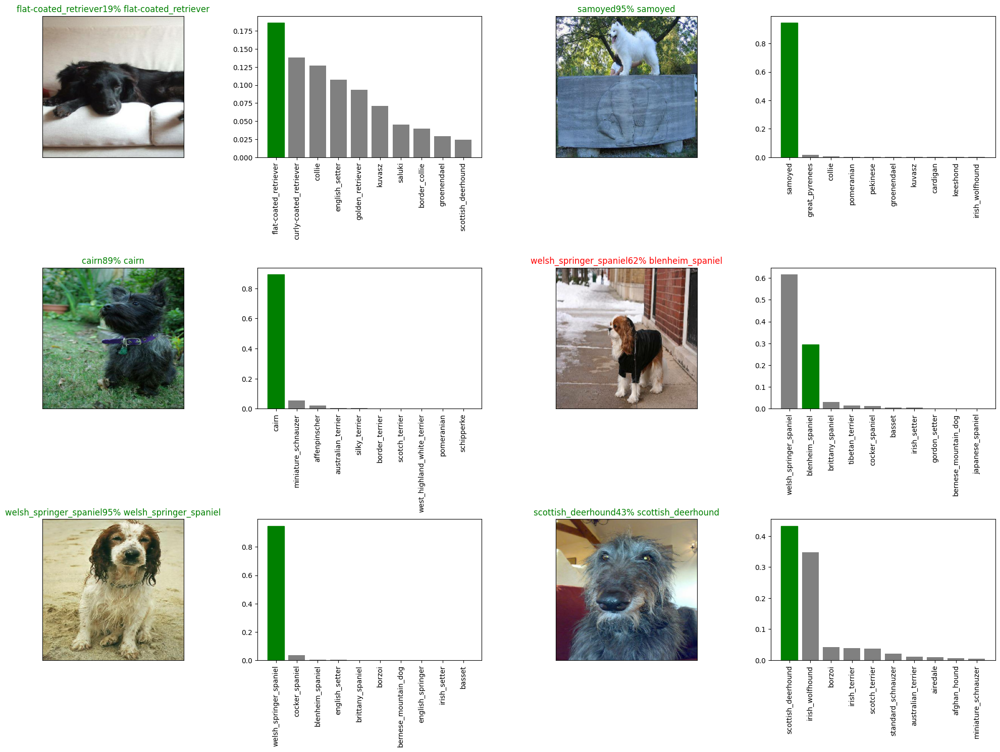

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier =20
num_rows = 3
num_cols = 2
num_images =num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i  in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows,2*num_cols,2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)

plt.tight_layout(h_pad=1.0)
plt.show()

**Challenge:** How would you create confusion matrix with our models prediction and true labels?

## Saving and reloading a trained model





In [ ]:
# Create a function to save a model.
def save_model(model,suffix=None):
  """
  Saves a given models in a directory and appends a suffix (string).
  """

  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/dog vision/model",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  model_path =modeldir+"-"+ suffix +".h5"  # save format of model
  print(f"Saving model to:{model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from:{model_path}")

  # Define custom objects
  custom_objects = {'KerasLayer': hub.KerasLayer}

  model=tf.keras.models.load_model(model_path,
                                   custom_objects=custom_objects)
  return model

Now we've got functions to save and load a trained model,  let;s make sure they work!

In [ ]:
# Save our model trained on 1000 images
save_model(model,suffix="1000-images-mobilebetv2-Adam")

Saving model to:drive/MyDrive/dog vision/model/20230713-084232-1000-images-mobilebetv2-Adam.h5...


'drive/MyDrive/dog vision/model/20230713-084232-1000-images-mobilebetv2-Adam.h5'

In [ ]:
# Load a trained model
loaded_1000_images_model=load_model("drive/MyDrive/dog vision/model/20230713-084232-1000-images-mobilebetv2-Adam.h5")

Loading saved model from:drive/MyDrive/dog vision/model/20230713-084232-1000-images-mobilebetv2-Adam.h5


In [ ]:
# Evaluate the loaded_ model
loaded_1000_images_model.evaluate(val_data)

7/7 [==============================] - 1s 84ms/step - loss: 1.2279 - accuracy: 0.6800


[1.227938175201416, 0.6800000071525574]

In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 77ms/step - loss: 1.2279 - accuracy: 0.6800


[1.227938175201416, 0.6800000071525574]

## Training a big dog model 🐶(on th full data)

In [ ]:
len(X),len(y)

(10222, 10222)

In [ ]:
X[:10]

['drive/MyDrive/dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/dog vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/dog vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/dog vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/dog vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/dog vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/dog vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/dog vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/dog vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Create a data batch with the full data set
full_data=create_data_batches(X,y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model=create_model()

Building model with : https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
# Create full model callbacks
full_model_tensorboard=create_tensorboard_callback()

# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping =tf.keras.callbacks.EarlyStopping (monitor="accuracy",
                                                             patience=3)

**NOTE:** Running the cell below will take a little while (maybe up to 30 minutes for the first epoch) beacuse the GPU we're using int the runtime has to load all of the images into memory.

In [ ]:
# Fit the full model to the full model
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks =[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 39s 109ms/step - loss: 1.3508 - accuracy: 0.6705
Epoch 2/100
320/320 [==============================] - 34s 106ms/step - loss: 0.4054 - accuracy: 0.8768
Epoch 3/100
320/320 [==============================] - 34s 105ms/step - loss: 0.2400 - accuracy: 0.9338
Epoch 4/100
320/320 [==============================] - 34s 107ms/step - loss: 0.1541 - accuracy: 0.9629
Epoch 5/100
320/320 [==============================] - 34s 105ms/step - loss: 0.1053 - accuracy: 0.9789
Epoch 6/100
320/320 [==============================] - 34s 106ms/step - loss: 0.0765 - accuracy: 0.9867
Epoch 7/100
320/320 [==============================] - 34s 105ms/step - loss: 0.0580 - accuracy: 0.9917
Epoch 8/100
320/320 [==============================] - 34s 106ms/step - loss: 0.0452 - accuracy: 0.9944
Epoch 9/100
320/320 [==============================] - 33s 105ms/step - loss: 0.0396 - accuracy: 0.9947
Epoch 10/100
320/320 [==============================] - 34s 105m

In [ ]:
save_model(full_model,"full-image-set-mobilenetv2-Adam")

Saving model to:drive/MyDrive/dog vision/model/20230713-090011-full-image-set-mobilenetv2-Adam.h5...


'drive/MyDrive/dog vision/model/20230713-090011-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
loaded_full_model=load_model("drive/MyDrive/dog vision/model/20230713-090011-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from:drive/MyDrive/dog vision/model/20230713-090011-full-image-set-mobilenetv2-Adam.h5


## Making Predictions on the test dataset

since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll
have to get it into save the same format.

Luckily we created `create_data_batches()`
earlier can take a list of filenames as input and cover them into Tensor batches.

To make predictions on the test data we'll:
* Get the test image filenames
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True`(since the test data doesn't have labels).
* Make a predictions array by passing the test batches to the `predict()` method called on our model.

In [ ]:
# Load test images filnames
test_path="drive/MyDrive/dog vision/test/"
test_filenames =[test_path+fnames for fnames in os.listdir(test_path)]

test_filenames[:10]

['drive/MyDrive/dog vision/test/df0196ea5d16d1570c1f2b567b975b90.jpg',
 'drive/MyDrive/dog vision/test/e34654831e228ad3ac1d0c463e70caf6.jpg',
 'drive/MyDrive/dog vision/test/e181bd9b192ab7b21b851a643c53c817.jpg',
 'drive/MyDrive/dog vision/test/e2166bdff9e35f80aa7984ec64c8cce8.jpg',
 'drive/MyDrive/dog vision/test/e29d2336a8559d96973c874c9c6c17c6.jpg',
 'drive/MyDrive/dog vision/test/e2b808864a5253fd356a9032915447a1.jpg',
 'drive/MyDrive/dog vision/test/e0f9b92adbba451d296678f466732969.jpg',
 'drive/MyDrive/dog vision/test/e42105cc55af6788d3c15473c562dc77.jpg',
 'drive/MyDrive/dog vision/test/dcbe4226672aa4af80c1e52a9bb78268.jpg',
 'drive/MyDrive/dog vision/test/e406358fe35be30ac65f11936c2a066e.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
#  Create test data batches
test_data=create_data_batches(test_filenames,test_data=True )

Creating test data batches....


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**NOTE:** Calling `Predict()` on our full model and passing if the test data batch will take a long time to run (about an ~1hr)

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions= loaded_full_model. predict(test_data,
                                            verbose=1)

324/324 [==============================] - 38s 115ms/step


In [ ]:
# Save Predictions (Numpy array ) to csv file (for acess later )
np.savetxt("drive/MyDrive/dog vision/preds2_array.csv", test_predictions,delimiter=",")

In [ ]:
# Load pre predictions (NumPy array) from csv file
test_predictions =np.loadtxt("drive/MyDrive/dog vision/preds2_array.csv",delimiter=",")

In [ ]:
test_predictions[:10]

array([[0.0010286 , 0.00102061, 0.00180784, ..., 0.00032521, 0.00085082,
        0.0037577 ],
       [0.00201042, 0.02559896, 0.02049946, ..., 0.00092469, 0.0002518 ,
        0.00676584],
       [0.0025253 , 0.01048012, 0.00458636, ..., 0.00761164, 0.0031029 ,
        0.01345592],
       ...,
       [0.00134655, 0.00410749, 0.00833327, ..., 0.00939138, 0.00125734,
        0.00799663],
       [0.0021852 , 0.00061796, 0.00105545, ..., 0.00179297, 0.0001651 ,
        0.00639371],
       [0.00106221, 0.0007978 , 0.01259354, ..., 0.00135321, 0.00221912,
        0.00474517]])

In [ ]:
test_predictions.shape

(10357, 120)

## preparing test dataset

Looking at the sample submission, we find that it wants our models prediction probability outputs in a DataFrame with an ID and a each different dog breed.

To get the data in this format, we'll:
* Create a pandas DataFrame with an ID column as well as a column for each dog breed
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilities) toeach of the dog breed columns.
*Export the DataFrame as a CSV to submit it to kaggle.

In [ ]:
#["id"]+list(unique_breeds)

In [ ]:
# Create a pandas Dataframe  with Empty columns
preds_df=pd.DataFrame(columns=["id"]+list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test images ID's to predictions DataFrame
test_ids=[os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"]=test_ids

In [ ]:
os.path.splitext(test_filenames[0])

('drive/MyDrive/dog vision/test/df0196ea5d16d1570c1f2b567b975b90', '.jpg')

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,df0196ea5d16d1570c1f2b567b975b90,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e34654831e228ad3ac1d0c463e70caf6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e181bd9b192ab7b21b851a643c53c817,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e2166bdff9e35f80aa7984ec64c8cce8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e29d2336a8559d96973c874c9c6c17c6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities
preds_df[list(unique_breeds)]=test_predictions
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,df0196ea5d16d1570c1f2b567b975b90,0.001029,0.001021,0.001808,0.020157,0.000803,0.016817,0.001743,0.001364,0.000610,...,0.000328,0.000260,0.081185,0.001779,0.000544,0.001231,0.002357,0.000325,0.000851,0.003758
1,e34654831e228ad3ac1d0c463e70caf6,0.002010,0.025599,0.020499,0.022785,0.006461,0.010296,0.041873,0.048795,0.006645,...,0.003696,0.001220,0.002111,0.011505,0.001747,0.017329,0.000800,0.000925,0.000252,0.006766
2,e181bd9b192ab7b21b851a643c53c817,0.002525,0.010480,0.004586,0.097192,0.006689,0.001119,0.010751,0.004784,0.016743,...,0.000376,0.006520,0.021755,0.002569,0.005458,0.000612,0.004048,0.007612,0.003103,0.013456
3,e2166bdff9e35f80aa7984ec64c8cce8,0.005409,0.008547,0.001589,0.022291,0.000054,0.000612,0.008335,0.009829,0.001432,...,0.008640,0.004205,0.006011,0.024760,0.029543,0.000180,0.005207,0.033454,0.010674,0.003076
4,e29d2336a8559d96973c874c9c6c17c6,0.000613,0.006268,0.004801,0.002711,0.150170,0.000780,0.017033,0.013736,0.003326,...,0.018933,0.003548,0.002212,0.001773,0.001353,0.004313,0.021167,0.003824,0.005363,0.001252
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10352,076d962aa496391d14bcf7dd8878a24c,0.006328,0.008191,0.005156,0.005487,0.019467,0.002358,0.004664,0.000744,0.003442,...,0.001965,0.000408,0.016883,0.007202,0.029874,0.001144,0.000862,0.000352,0.010460,0.003019
10353,073b0f066231ef6c0b2a0e1142dae338,0.006271,0.018091,0.000976,0.001759,0.000543,0.006265,0.007055,0.000269,0.014215,...,0.020235,0.002311,0.005887,0.014379,0.007650,0.000760,0.000711,0.010541,0.010621,0.020440
10354,090179e04f4d8bf313d0fc97c1879b3f,0.000373,0.002477,0.001598,0.000148,0.001809,0.004673,0.001989,0.003540,0.003864,...,0.079582,0.082212,0.044994,0.001122,0.009485,0.000789,0.000385,0.002242,0.000253,0.008807
10355,07d9d2f42eb35dd4d84b184abc4e8412,0.002796,0.001696,0.000705,0.092376,0.004825,0.000228,0.007556,0.003689,0.003097,...,0.024228,0.000214,0.004038,0.006688,0.015240,0.002911,0.005687,0.005852,0.007058,0.024560


In [ ]:
# Save our predictions dataframe to csv
preds_df.to_csv("drive/MyDrive/dog vision/full_model_predictions_submission.csv",index=False)